In [1]:
import librosa
import matplotlib.pyplot as plt
import numpy as np
import mpld3
mpld3.enable_notebook()

/Users/christoper/.pyenv/versions/3.7.6/lib/python3.7/site-packages/librosa/util/decorators.py:9: NumbaDeprecationWarning: An import was requested from a module that has moved location.
Import requested from: 'numba.decorators', please update to use 'numba.core.decorators' or pin to Numba version 0.48.0. This alias will not be present in Numba version 0.50.0.
  from numba.decorators import jit as optional_jit
/Users/christoper/.pyenv/versions/3.7.6/lib/python3.7/site-packages/librosa/util/decorators.py:9: NumbaDeprecationWarning: An import was requested from a module that has moved location.
Import of 'jit' requested from: 'numba.decorators', please update to use 'numba.core.decorators' or pin to Numba version 0.48.0. This alias will not be present in Numba version 0.50.0.
  from numba.decorators import jit as optional_jit


# Section 1

In [2]:
y1, sr1 = librosa.core.load("AudioFiles/speech1.wav", sr=None)
y2, sr2 = librosa.core.load('AudioFiles/speech2.wav', sr=None)

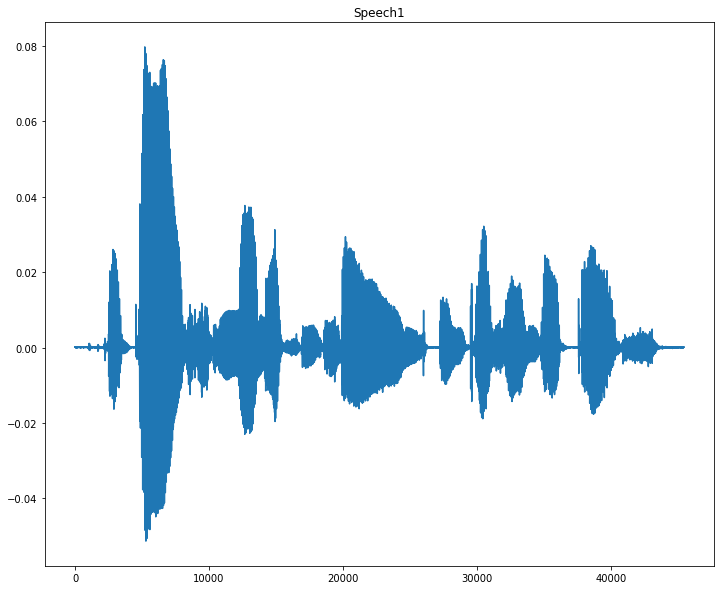

In [3]:
plt.figure(figsize=(12,10))
plt.title("Speech1")
plt.plot(y1)

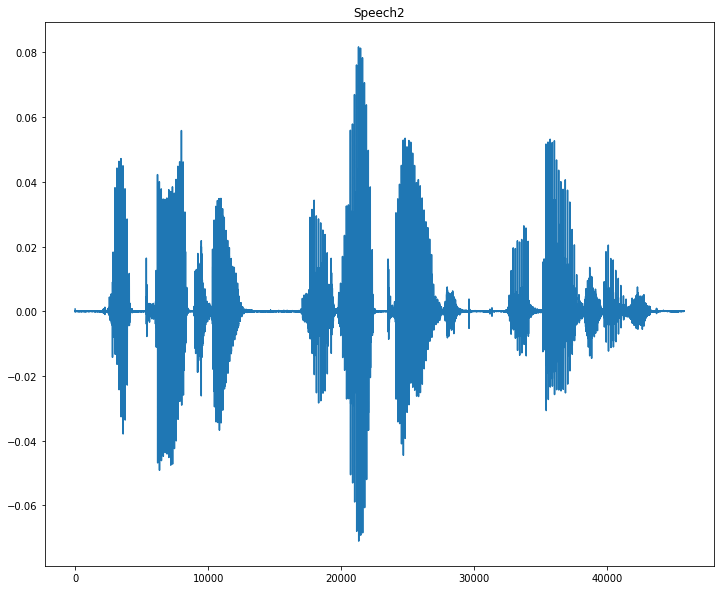

In [4]:
plt.figure(figsize=(12,10))
plt.title("Speech2")
plt.plot(y2)

In [5]:
Time1 = np.linspace(0, len(y1) / sr1, num=len(y1))
Time2 = np.linspace(0, len(y2) / sr2, num=len(y2))

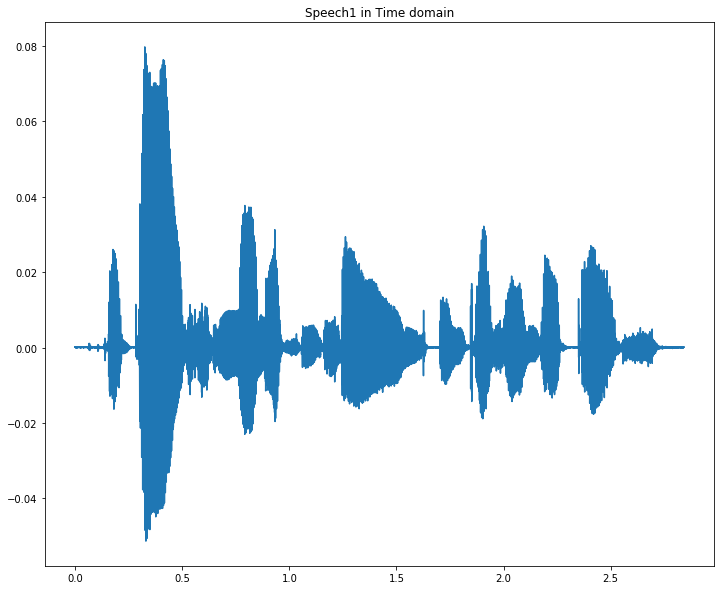

In [6]:
plt.figure(figsize=(12,10))
plt.title("Speech1 in Time domain")
plt.plot(Time1, y1)

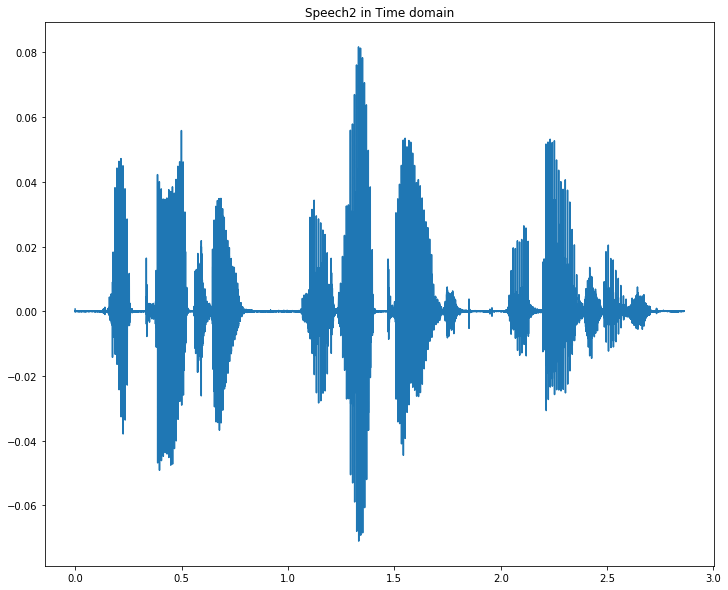

In [7]:
plt.figure(figsize=(12,10))
plt.title("Speech2 in Time domain")
plt.plot(Time2, y2)

### If we take time from 0.40s to 0.42 seconds we get 4 peaks or 4 zero crossings. Then we do 4/(0.42 - 0.40) = 4/0.02 = 200Hz.  An by listening to the signal we can confirm it is a female speaker

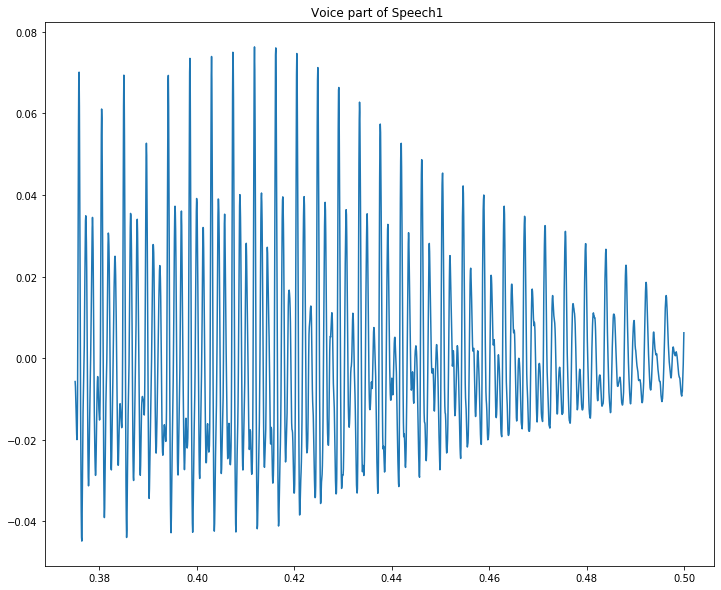

In [8]:
plt.figure(figsize=(12,10))
plt.title("Voice part of Speech1 ")
plt.plot(Time1[6000:8000],y1[6000:8000])

In [9]:
import sounddevice

In [10]:
sounddevice.play(y1, sr1)

### If we take time from 0.40s to 0.42 seconds we get 2 peaks or 2 zero crossings. Then we get 2/(0.42 - 0.40) = 2/0.02 = 100Hz.  An by listening to the signal we can confirm it is a male speaker

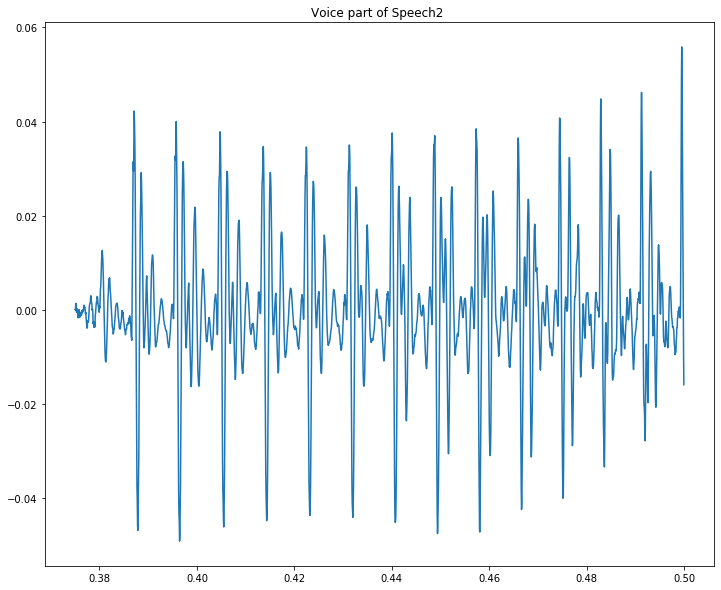

In [11]:
plt.figure(figsize=(12,10))
plt.title("Voice part of Speech2 ")
plt.plot(Time2[6000:8000],y2[6000:8000])

In [12]:
import sounddevice

In [13]:
sounddevice.play(y2, sr2)

Voiced sounds are produced if the airflow is interrupted periodically by the movements (vibration)
of the vocal cords

Unvoiced sounds are generated by a constriction at the open glottis or along the
vocal tract causing a non-periodic turbulent air flow.

# Section 2

sampling_rate = 1/delta_t <br>
block_size (frame_length in our case) = N <br>
frame_size = N . delta_t <br>

In [156]:
def my_window(signal, sampling_rate, frame_length, frame_shift):
    m = []
    v = []
    
    n_length = int(sampling_rate * frame_length / 1000) # how many frames in 1 segment 
    n_shift = int(sampling_rate * frame_shift / 1000) # how many frames to shift
    
    total_segments = 1 + (signal.shape[0] - n_length) // n_shift
    
    for i in range(total_segments):
        start = i * n_shift
        end = start + n_length
        
        center = (start + end) / 2
        period = center / sampling_rate
        
        v.append(period)
        m.append(signal[start:end])

    m = np.array(m)
    v = np.array(v)
    
    return m, v

# Section 3

Compare first frame to other frames and takes the arg max of the convolution as the fundamental period

In [207]:
def get_fundamental_freq(signal, sampling_rate):
    m, v = my_window(signal, sampling_rate, 32, 16)
    res = []
    for frame in m:
        corrs = np.convolve(frame, frame[::-1])
        corrs = corrs[corrs.shape[0]//2:] # remove negative lags
        
        lags = np.arange(corrs.shape[0]) # lags index
        periods = lags / sampling_rate
        freqs = np.ones(periods.shape[0]) / periods
        
        mask = ((freqs > 80.0) & (freqs < 400.0)) # mask to select freq ranging from 80 to 400
        
        filtered_corrs = np.zeros(corrs.shape[0])
        filtered_corrs[mask] = corrs[mask] # set out of range freq correlation to 0
        
        max_freq_idx = np.argmax(filtered_corrs) # take the idx where the correlation is maximum
        res.append(freqs[max_freq_idx]) # get the fundamental freq
        

    res = np.array(res)
    return res

In [213]:
f0_1 = get_fundamental_freq(y1, sr1)

/Users/christoper/.pyenv/versions/3.7.6/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.


Text(0.5, 0, 'seconds')

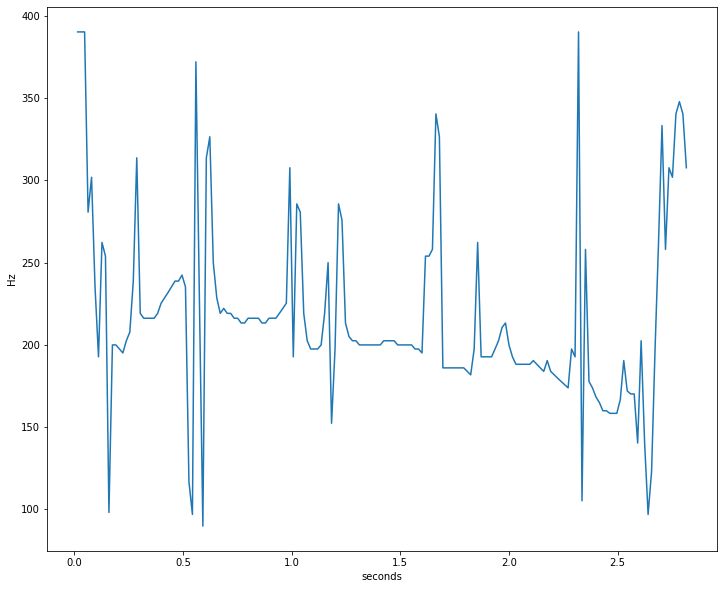

In [212]:
plt.figure(figsize=(12,10))
plt.plot(v, f0_1)
plt.ylabel("Hz")
plt.xlabel("seconds")

## Answer 3e

The part of signal that has reasonable fundamental frequency where it has vocal phone since vocal phone has periodic signal

## Speech 2

/Users/christoper/.pyenv/versions/3.7.6/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.


Text(0.5, 0, 'seconds')

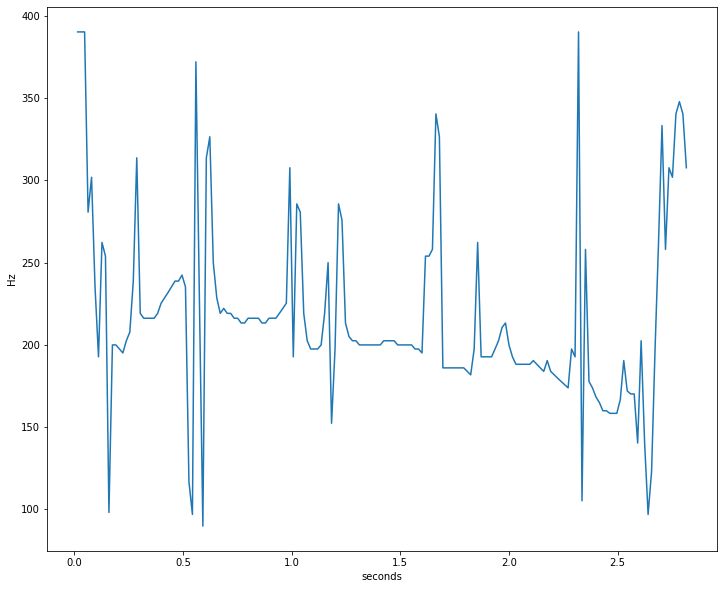

In [215]:
f0_2 = get_fundamental_freq(y2, sr2)
plt.figure(figsize=(12,10))
plt.plot(v, f0_1)
plt.ylabel("Hz")
plt.xlabel("seconds")